In [3]:
!curl -L "https://app.roboflow.com/ds/wzyJqFOS43?key=YzLPKKQ6KM" > roboflow.zip; mkdir dataset; unzip roboflow.zip -d dataset; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   904  100   904    0     0   2974      0 --:--:-- --:--:-- --:--:--  2983
100 30.3M  100 30.3M    0     0  27.6M      0  0:00:01  0:00:01 --:--:-- 93.5M
Archive:  roboflow.zip
  inflating: dataset/README.dataset.txt  
  inflating: dataset/README.roboflow.txt  
  inflating: dataset/data.yaml       
   creating: dataset/test/
   creating: dataset/test/images/
 extracting: dataset/test/images/07f77541-d7df-4db0-a1bf-0aab59e32806_jpeg.rf.0ecc2271ab7b5cfb301216cc473858d1.jpg  
 extracting: dataset/test/images/0898757da56ccd490638522956b66861_jpg.rf.02450eb4aa5f3f93a26503f3a4428bdd.jpg  
 extracting: dataset/test/images/1697241_jpg.rf.b7cd68cd5ff96de98d0a17efdc587d9e.jpg  
 extracting: dataset/test/images/2607998D32_X_jpg.rf.623616d2d442eafe4d69c3df86d79d6f.jpg  
 extracting: dataset/test/images/2607998D32_X_jpg.rf.f12b4e25fd9431c0

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from sklearn.neighbors import KDTree

from skimage.exposure import equalize_adapthist
from skimage.color import rgb2lab, lab2rgb

import os
import glob
import time

### 1. АРХИТЕКТУРА МОДЕЛИ MCNN [взято из статьи](https://openaccess.thecvf.com/content_cvpr_2016/papers/Zhang_Single-Image_Crowd_Counting_CVPR_2016_paper.pdf)

Изначально, модель была без функции активации на выходе. Но это ведет к возможности отрицательного выхода, что противоречит концепции карты плотности. Для отсечения отрицательных величин, можно использовать ReLU. Однако, я столкнулся с полным отсутсвием обучения. Вероятно, проблема в явлении "умирающего ReLU". Замена ReLU на softplus это решает. Однако, модель начинает застревать во время обучения. Я пробовал дропауты, ограничение грандиентов и weight decay.

In [5]:
# ==============================================================================
# 1. АРХИТЕКТУРА МОДЕЛИ MCNN С BATCH NORMALIZATION
# ==============================================================================
class MCNN(nn.Module):
    def __init__(self, dropout_p=0.25):
        super(MCNN, self).__init__()

        # --- Ветка 1 (Большие фильтры) ---
        self.branch1 = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=9, padding=4),
            nn.BatchNorm2d(16), # <--- ДОБАВЛЕНО
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(16, 32, kernel_size=7, padding=3),
            nn.BatchNorm2d(32), # <--- ДОБАВЛЕНО
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 16, kernel_size=7, padding=3),
            nn.BatchNorm2d(16), # <--- ДОБАВЛЕНО
            nn.ReLU(inplace=True),
            # Dropout можно оставить, но для начала можно попробовать без него,
            # так как BatchNorm сам по себе регуляризатор.
            # nn.Dropout(p=dropout_p),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(16, 8, kernel_size=7, padding=3),
            nn.BatchNorm2d(8), # <--- ДОБАВЛЕНО
            nn.ReLU(inplace=True),
        )

        # --- Ветка 2 (Средние фильтры) ---
        self.branch2 = nn.Sequential(
            nn.Conv2d(3, 20, kernel_size=7, padding=3),
            nn.BatchNorm2d(20), # <--- ДОБАВЛЕНО
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(20, 40, kernel_size=5, padding=2),
            nn.BatchNorm2d(40), # <--- ДОБАВЛЕНО
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(40, 20, kernel_size=5, padding=2),
            nn.BatchNorm2d(20), # <--- ДОБАВЛЕНО
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(20, 10, kernel_size=5, padding=2),
            nn.BatchNorm2d(10), # <--- ДОБАВЛЕНО
            nn.ReLU(inplace=True),
        )

        # --- Ветка 3 (Маленькие фильтры) ---
        # ... (аналогично добавляем BatchNorm2d после каждой свертки) ...
        self.branch3 = nn.Sequential(
            nn.Conv2d(3, 24, kernel_size=5, padding=2),
            nn.BatchNorm2d(24),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(24, 48, kernel_size=3, padding=1),
            nn.BatchNorm2d(48),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(48, 24, kernel_size=3, padding=1),
            nn.BatchNorm2d(24),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(24, 12, kernel_size=3, padding=1),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
        )

        self.fuse = nn.Sequential(
            nn.Conv2d(30, 1, kernel_size=1, padding=0),
            #nn.Softplus()
        )

    def forward(self, x):
        x1 = self.branch1(x)
        x2 = self.branch2(x)
        x3 = self.branch3(x)
        x = torch.cat((x1, x2, x3), 1)
        x = self.fuse(x)
        return x

### 2. КЛАСС ДЛЯ РАБОТЫ С ЛОКАЛЬНЫМ ДАТАСЕТОМ

In [6]:
# ==============================================================================
# 2. КЛАСС ДЛЯ РАБОТЫ С ЛОКАЛЬНЫМ ДАТАСЕТОМ
# ==============================================================================
class LocalCrowdDataset(Dataset):
    def __init__(self, root_dir, downscale_factor=8, k_neighbors=4, beta=0.3):
        self.image_dir = os.path.join(root_dir, 'images')
        self.label_dir = os.path.join(root_dir, 'labels')
        self.image_files = sorted(glob.glob(os.path.join(self.image_dir, '*.jpg')))

        self.downscale_factor = downscale_factor
        self.k_neighbors = k_neighbors
        self.beta = beta

        self.transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = self.image_files[idx]
        image = Image.open(img_path).convert('RGB')

        image = image.resize((224, 224), Image.BILINEAR)
        
        # # 1. Преобразуем PIL Image в numpy array
        # img_np = np.array(image)

        # # 2. Конвертируем из RGB в LAB
        # img_lab = rgb2lab(img_np)

        # # 3. Извлекаем L-канал (яркость) и нормализуем его в диапазон [0, 1],
        # # так как equalize_adapthist ожидает float-изображение в этом диапазоне.
        # # L-канал в skimage.color.lab2rgb находится в диапазоне [0, 100].
        # l_channel = img_lab[:, :, 0]
        # l_channel_scaled = l_channel / 100.0

        # # 4. Применяем CLAHE только к каналу яркости
        # l_channel_eq = equalize_adapthist(l_channel_scaled, clip_limit=0.02)

        # # 5. Возвращаем L-канал в исходный диапазон [0, 100] и заменяем им старый
        # img_lab[:, :, 0] = l_channel_eq * 100

        # # 6. Конвертируем обратно из LAB в RGB
        # img_rgb_eq = lab2rgb(img_lab)

        # # 7. Преобразуем в uint8. lab2rgb может вернуть значения чуть вне диапазона [0,1],
        # # поэтому нужно обрезать их с помощью np.clip.
        # img_uint8 = (np.clip(img_rgb_eq, 0, 1) * 255).astype(np.uint8)

        # # 8. Конвертируем обратно в PIL Image для совместимости с остальным кодом
        # image = Image.fromarray(img_uint8)


        
        filename = os.path.basename(img_path)
        annotation_name = os.path.splitext(filename)[0] + '.txt'
        annotation_path = os.path.join(self.label_dir, annotation_name)

        points = self.get_box_centers(annotation_path, image.width, image.height)
        density_map = self.create_adaptive_density_map(points, (image.height, image.width))

        image_tensor = self.transform(image)
        density_map_tensor = torch.from_numpy(density_map).unsqueeze(0)

        # Возвращаем также оригинальное изображение для визуализации
        return image_tensor, density_map_tensor, transforms.ToTensor()(image)

    def get_box_centers(self, annotation_path, img_w, img_h):
        points = []
        if not os.path.exists(annotation_path):
            return np.array(points)

        with open(annotation_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) < 5: continue # пропустить пустые или неправильные строки
                x_center = float(parts[1]) * img_w
                y_center = float(parts[2]) * img_h
                points.append([x_center, y_center])
        return np.array(points)

    # ... внутри класса LocalCrowdDataset ...
    def create_adaptive_density_map(self, points, img_shape):
        h, w = img_shape
        output_h, output_w = h // self.downscale_factor, w // self.downscale_factor
        density_map = np.zeros((output_h, output_w), dtype=np.float32)

        if len(points) == 0:
            return density_map

        scaled_points = points / self.downscale_factor

        # Если точек меньше, чем k_neighbors, используем фиксированную sigma
        if len(points) < self.k_neighbors:
            for p in scaled_points:
                p_y, p_x = int(p[1]), int(p[0])
                if 0 <= p_y < output_h and 0 <= p_x < output_w:
                    density_map[p_y, p_x] = 1.0 # Просто ставим точку
            # И применяем фиксированное размытие
            # Важно: Сумма после размытия не будет равна кол-ву точек,
            # поэтому мы должны нормировать карту, чтобы сумма стала равна кол-ву точек.
            if density_map.sum() > 0:
                 density_map = gaussian_filter(density_map, sigma=2.5)
                 density_map = density_map / density_map.sum() * len(points)
        else:
            # Для достаточного количества точек используем адаптивный метод
            tree = KDTree(scaled_points, leaf_size=30, metric='euclidean')
            distances, _ = tree.query(scaled_points, k=self.k_neighbors)

            for i, p in enumerate(scaled_points):
                p_y, p_x = int(p[1]), int(p[0])
                if not (0 <= p_y < output_h and 0 <= p_x < output_w): continue

                # Используем расстояние до k-1 соседей (не считая саму точку)
                avg_distance = distances[i][1:].mean() if self.k_neighbors > 1 else distances[i][0]

                # Вычисляем sigma
                sigma = avg_distance * self.beta
                sigma = max(1.0, sigma)  # Сигма не должна быть слишком маленькой
                sigma = min(7.0, sigma)  # И не слишком большой для маленьких карт

                # Создаем гауссиану
                size = int(2 * np.ceil(2.5 * sigma) + 1)
                if size % 2 == 0: size += 1 # размер должен быть нечетным

                center = size // 2
                grid_y, grid_x = np.ogrid[-center:center+1, -center:center+1]
                g = np.exp(-(grid_x**2 + grid_y**2) / (2 * sigma**2))

                # !!! ГЛАВНОЕ ИСПРАВЛЕНИЕ: НОРМАЛИЗАЦИЯ ГАУССИАНЫ !!!
                # Мы делим ее на собственную сумму, чтобы ее "масса" стала равна 1.0
                g_sum = g.sum()
                if g_sum > 0:
                    g = g / g_sum

                # Определяем границы для наложения гауссианы на карту
                y_start = max(0, p_y - center)
                y_end = min(output_h, p_y + center + 1)
                x_start = max(0, p_x - center)
                x_end = min(output_w, p_x + center + 1)

                # Определяем границы самой гауссианы для случая, если она выходит за край карты
                g_y_start = center - (p_y - y_start)
                g_y_end = center + (y_end - p_y)
                g_x_start = center - (p_x - x_start)
                g_x_end = center + (x_end - p_x)

                density_map[y_start:y_end, x_start:x_end] += g[g_y_start:g_y_end, g_x_start:g_x_end]

        return density_map

### 3. ФУНКЦИЯ ВИЗУАЛИЗАЦИИ ДАННЫХ

In [7]:
# ==============================================================================
# 3. ФУНКЦИЯ ВИЗУАЛИЗАЦИИ ДАННЫХ
# ==============================================================================
def visualize_dataset_samples(dataset, num_samples=4):
    print("Visualizing a few dataset samples to check correctness...")
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, num_samples * 5))
    if num_samples == 1:
        axes = [axes]

    for i in range(num_samples):
        _, density_map, original_image = dataset[i]

        gt_count = density_map.sum().item()

        # Оригинальное изображение
        ax = axes[i][0]
        ax.imshow(original_image.permute(1, 2, 0))
        ax.set_title(f"Sample {i+1}: Original Image")
        ax.axis('off')

        # Карта плотности
        ax = axes[i][1]
        im = ax.imshow(density_map.squeeze(), cmap='jet')
        ax.set_title(f"Ground Truth Density Map\n(Count: {gt_count:.2f})")
        ax.axis('off')
        fig.colorbar(im, ax=ax)

    plt.tight_layout()
    plt.show()

### 4. ОСНОВНОЙ СКРИПТ ОБУЧЕНИЯ

Using device: cuda
Creating datasets and dataloaders...
Visualizing a few dataset samples to check correctness...


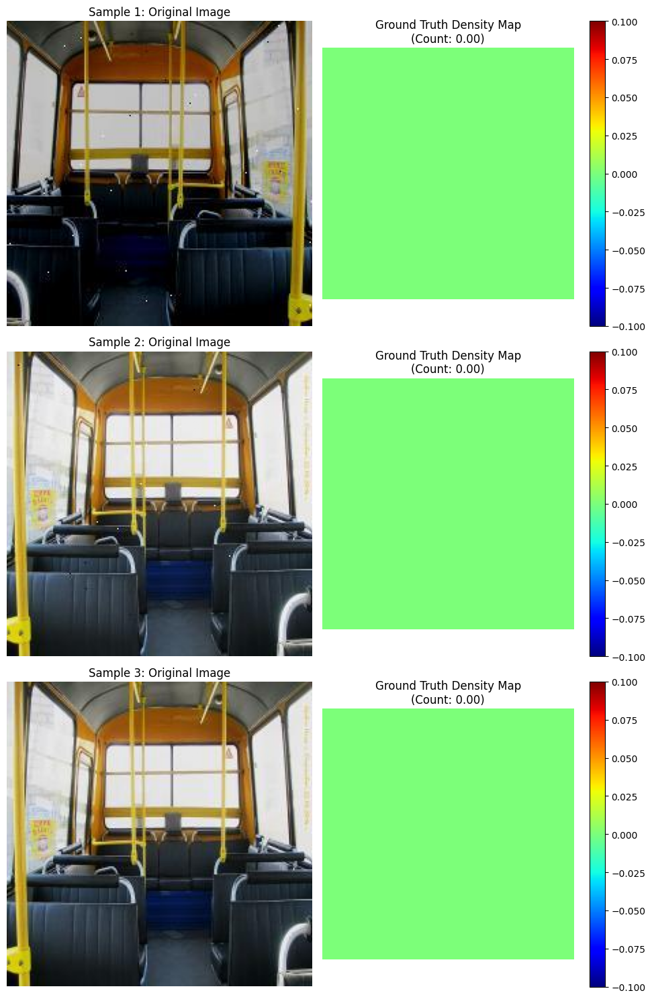

Train samples: 2379, Valid samples: 458, Test samples: 212
weights loaded!

--- Starting Training ---
** Epoch 1: New best model saved with MAE: 1.60 **
Epoch [1/300] | Time: 13.0s | Train Loss: 0.1498 | Val MAE: 1.60 | Val RMSE: 2.23
  └─ MSE: 0.1263 | MAE: 0.0054 | SSIM: 0.1171 | Neg: 0.0010
** Epoch 2: New best model saved with MAE: 1.42 **
Epoch [2/300] | Time: 11.0s | Train Loss: 0.1459 | Val MAE: 1.42 | Val RMSE: 2.01
  └─ MSE: 0.1235 | MAE: 0.0053 | SSIM: 0.1099 | Neg: 0.0009
** Epoch 3: New best model saved with MAE: 1.33 **
Epoch [3/300] | Time: 10.8s | Train Loss: 0.1460 | Val MAE: 1.33 | Val RMSE: 1.93
  └─ MSE: 0.1234 | MAE: 0.0053 | SSIM: 0.1116 | Neg: 0.0010
Epoch [4/300] | Time: 10.9s | Train Loss: 0.1473 | Val MAE: 1.44 | Val RMSE: 2.00
  └─ MSE: 0.1247 | MAE: 0.0053 | SSIM: 0.1112 | Neg: 0.0009
Epoch [5/300] | Time: 10.9s | Train Loss: 0.1452 | Val MAE: 1.37 | Val RMSE: 1.93
  └─ MSE: 0.1232 | MAE: 0.0052 | SSIM: 0.1072 | Neg: 0.0009
** Epoch 6: New best model saved wi

KeyboardInterrupt: 

In [8]:
# ==============================================================================
# 4. ОСНОВНОЙ СКРИПТ ОБУЧЕНИЯ
# ==============================================================================

# --- НАСТРОЙКИ ---
DATASET_ROOT = '/kaggle/working/dataset' # Путь к корневой папке вашего датасета
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LEARNING_RATE = 1e-4
BATCH_SIZE = 64
EPOCHS = 300
DOWNSCALE = 8

print(f"Using device: {DEVICE}")

# --- СОЗДАНИЕ DATALOADER'ов ---
print("Creating datasets and dataloaders...")
train_dir = os.path.join(DATASET_ROOT, 'train')
valid_dir = os.path.join(DATASET_ROOT, 'valid')
test_dir = os.path.join(DATASET_ROOT, 'test')

train_dataset = LocalCrowdDataset(train_dir, downscale_factor=DOWNSCALE)
valid_dataset = LocalCrowdDataset(valid_dir, downscale_factor=DOWNSCALE)
test_dataset = LocalCrowdDataset(test_dir, downscale_factor=DOWNSCALE)

# --- ПРОВЕРКА ДАННЫХ ---
visualize_dataset_samples(train_dataset, num_samples=3)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print(f"Train samples: {len(train_dataset)}, Valid samples: {len(valid_dataset)}, Test samples: {len(test_dataset)}")

# --- ИНИЦИАЛИЗАЦИЯ МОДЕЛИ, LOSS, ОПТИМИЗАТОРА ---
model = MCNN().to(DEVICE)
try:
    model.load_state_dict(torch.load('/kaggle/input/mcnn1/pytorch/default/1/best_model_mcnn (3).pth'))
    print("weights loaded!")
except:
    print("cant load weights!")

# --- ФУНКЦИЯ ЛОССА ---
import torch.nn.functional as F

def ssim_loss(pred, target, window_size=11, size_average=True):
    """
    Structural Similarity Index (SSIM) loss для карт плотности.
    Помогает сохранить локальную структуру и пространственные паттерны.
    """
    def create_window(window_size, channel):
        def gaussian(window_size, sigma):
            gauss = torch.Tensor([
                np.exp(-(x - window_size//2)**2 / float(2*sigma**2)) 
                for x in range(window_size)
            ])
            return gauss / gauss.sum()
        
        _1D_window = gaussian(window_size, 1.5).unsqueeze(1)
        _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
        window = _2D_window.expand(channel, 1, window_size, window_size).contiguous()
        return window
    
    channel = pred.size(1)
    window = create_window(window_size, channel).to(pred.device)
    
    mu1 = F.conv2d(pred, window, padding=window_size//2, groups=channel)
    mu2 = F.conv2d(target, window, padding=window_size//2, groups=channel)
    
    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1 * mu2
    
    sigma1_sq = F.conv2d(pred * pred, window, padding=window_size//2, groups=channel) - mu1_sq
    sigma2_sq = F.conv2d(target * target, window, padding=window_size//2, groups=channel) - mu2_sq
    sigma12 = F.conv2d(pred * target, window, padding=window_size//2, groups=channel) - mu1_mu2
    
    C1 = 0.01 ** 2
    C2 = 0.03 ** 2
    
    ssim_map = ((2 * mu1_mu2 + C1) * (2 * sigma12 + C2)) / \
               ((mu1_sq + mu2_sq + C1) * (sigma1_sq + sigma2_sq + C2))
    
    if size_average:
        return 1 - ssim_map.mean()
    else:
        return 1 - ssim_map.mean(1).mean(1).mean(1)


def combined_mse_mae_ssim_loss(pred, target, alpha=10.0, beta=1.0, gamma=0.05, lambda_neg=10.0):
    """
    Комбинированная функция потерь для задачи подсчета толпы:
    
    Args:
        pred: предсказанные карты плотности
        target: целевые карты плотности
        alpha: вес для MSE (фокус на больших ошибках)
        beta: вес для MAE (фокус на общем подсчете)
        gamma: вес для SSIM (фокус на локализации и структуре)
        lambda_neg: штраф за отрицательные значения
    
    Returns:
        комбинированный loss
    """
    # MSE - наказывает большие ошибки сильнее, хорош для точности подсчета
    mse_loss = F.mse_loss(pred*30, target*30, reduction='mean')
    
    # MAE - более робастный к выбросам, хорош для общего подсчета
    mae_loss = F.l1_loss(pred, target, reduction='mean')
    
    # SSIM - сохраняет локальную структуру и пространственные паттерны
    ssim = ssim_loss(pred, target)
    
    # Штраф за отрицательные значения (плотность не может быть отрицательной)
    neg_penalty = F.relu(-pred).mean() * lambda_neg
    
    # Комбинированный loss
    total_loss = alpha * mse_loss + beta * mae_loss + gamma * ssim + neg_penalty
    
    return total_loss, {
        'mse': mse_loss.item(),
        'mae': mae_loss.item(),
        'ssim': ssim.item(),
        'neg_penalty': neg_penalty.item()
    }


optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

# --- ЦИКЛ ОБУЧЕНИЯ И ВАЛИДАЦИИ ---
best_mae = float('inf')
print("\n--- Starting Training ---")
for epoch in range(EPOCHS):
    start_time = time.time()

    # -- Тренировка --
    model.train()
    epoch_train_loss = 0
    epoch_metrics = {'mse': 0, 'mae': 0, 'ssim': 0, 'neg_penalty': 0}
    
    for images, density_maps, _ in train_loader:
        images = images.to(DEVICE)
        density_maps = density_maps.to(DEVICE)
        
        optimizer.zero_grad()
        predicted_maps = model(images)
        
        # Используем новую комбинированную loss функцию
        # Вы можете настроить веса alpha, beta, gamma под свою задачу
        loss, metrics = combined_mse_mae_ssim_loss(
            predicted_maps, 
            density_maps,
            alpha=1.0,      # вес MSE
            beta=2.0,       # вес MAE
            gamma=0.1,      
            lambda_neg=2.0 # штраф за отрицательные значения
        )
        
        loss.backward()
        
        # Ограничиваем норму градиентов для стабильности
        #torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        
        optimizer.step()
        
        epoch_train_loss += loss.item()
        for key in epoch_metrics:
            epoch_metrics[key] += metrics[key]

    # -- Валидация --
    model.eval()
    epoch_val_mae = 0
    epoch_val_mse = 0
    with torch.no_grad():
        for images, density_maps, _ in valid_loader:
            images = images.to(DEVICE)
            predicted_maps = model(images)
            gt_count = density_maps.sum().item()
            pred_count = predicted_maps.sum().item()
            epoch_val_mae += abs(gt_count - pred_count)
            epoch_val_mse += (gt_count - pred_count)**2

    avg_train_loss = epoch_train_loss / len(train_loader)
    avg_val_mae = epoch_val_mae / len(valid_dataset)
    avg_val_rmse = np.sqrt(epoch_val_mse / len(valid_dataset))
    
    # Средние значения метрик
    for key in epoch_metrics:
        epoch_metrics[key] /= len(train_loader)

    if avg_val_mae < best_mae:
        best_mae = avg_val_mae
        torch.save(model.state_dict(), 'best_model_mcnn.pth')
        print(f"** Epoch {epoch+1}: New best model saved with MAE: {best_mae:.2f} **")

    scheduler.step()

    epoch_time = time.time() - start_time
    print(f"Epoch [{epoch+1}/{EPOCHS}] | Time: {epoch_time:.1f}s | "
          f"Train Loss: {avg_train_loss:.4f} | Val MAE: {avg_val_mae:.2f} | Val RMSE: {avg_val_rmse:.2f}")
    print(f"  └─ MSE: {epoch_metrics['mse']:.4f} | MAE: {epoch_metrics['mae']:.4f} | "
          f"SSIM: {epoch_metrics['ssim']:.4f} | Neg: {epoch_metrics['neg_penalty']:.4f}")

In [9]:
# --- ТЕСТИРОВАНИЕ ЛУЧШЕЙ МОДЕЛИ ---
print("\n--- Testing on the test set ---")
model = MCNN().to("cuda")
model.load_state_dict(torch.load('best_model_mcnn.pth'))
model.eval()

test_mae, test_mse = 0, 0
with torch.no_grad():
    for images, density_maps, _ in test_loader:
        images = images.to(DEVICE)
        predicted_maps = model(images)
        gt_count = density_maps.sum().item()
        pred_count = predicted_maps.sum().item()
        test_mae += abs(gt_count - pred_count)
        test_mse += (gt_count - pred_count)**2

avg_test_mae = test_mae / len(test_dataset)
avg_test_mse = np.sqrt(test_mse / len(test_dataset))
print(f"Final MAE on Test Set: {avg_test_mae:.2f}")
print(f"Final MSE on Test Set: {avg_test_mse:.2f}")


--- Testing on the test set ---
Final MAE on Test Set: 1.33
Final MSE on Test Set: 1.85


In [11]:
# ==============================================================================
# 3. ФУНКЦИЯ ВИЗУАЛИЗАЦИИ РЕЗУЛЬТАТОВ
# ==============================================================================
def visualize_predictions(model, dataset, num_samples=5, device='cpu'):
    """
    Визуализирует предсказания модели на случайных примерах из датасета.
    """
    # Устанавливаем модель в режим оценки
    model.eval()

    # Выбираем случайные индексы из датасета
    sample_indices = random.sample(range(len(dataset)), num_samples)

    fig, axes = plt.subplots(num_samples, 3, figsize=(15, num_samples * 5))
    if num_samples == 1:
        axes = [axes]

    for i, idx in enumerate(sample_indices):
        # Получаем данные
        # Наш кастомный датасет возвращает (image_tensor, density_map_tensor, original_image_tensor)
        img_tensor, gt_map, original_img = dataset[idx]

        # Добавляем batch-измерение для подачи в модель
        img_tensor_batch = img_tensor.unsqueeze(0).to(device)

        # Делаем предсказание
        with torch.no_grad():
            pred_map = model(img_tensor_batch).cpu()

        # Считаем количество
        gt_count = gt_map.sum().item()
        pred_count = pred_map.sum().item()

        # Де-нормализуем изображение для корректного отображения
        img_display = original_img.numpy().transpose(1, 2, 0)

        # 1. Оригинальное изображение
        ax = axes[i][0]
        ax.imshow(img_display)
        ax.set_title(f"Sample {i+1}: Original Image")
        ax.axis('off')

        # 2. Ground Truth Density Map
        ax = axes[i][1]
        im = ax.imshow(gt_map.squeeze(), cmap='jet')
        ax.set_title(f"Ground Truth\n(Count: {gt_count:.2f})")
        ax.axis('off')

        # 3. Predicted Density Map
        ax = axes[i][2]
        im = ax.imshow(pred_map.squeeze(), cmap='jet')
        ax.set_title(f"Prediction\n(Count: {pred_count:.2f})")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

Loading model from best_model_mcnn.pth...
Model loaded successfully.
Visualizing 47 random predictions from the test set...


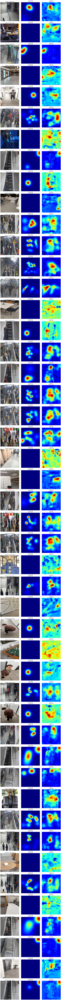

In [12]:
import random

MODEL_PATH = 'best_model_mcnn.pth'  # Путь к вашей обученной модели
DATASET_ROOT = '/kaggle/working/dataset'          # Путь к корневой папке датасета
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
NUM_SAMPLES_TO_SHOW = 47             # Сколько случайных примеров показать

# --- ЗАГРУЗКА МОДЕЛИ ---
print(f"Loading model from {MODEL_PATH}...")
model = MCNN().to(DEVICE)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
print("Model loaded successfully.")

# --- ЗАГРУЗКА ТЕСТОВОГО ДАТАСЕТА ---
# Важно: используйте те же параметры (downscale_factor и т.д.), что и при обучении
test_dir = os.path.join(DATASET_ROOT, 'test')
test_dataset = LocalCrowdDataset(test_dir, downscale_factor=8)

# --- ВИЗУАЛИЗАЦИЯ ---
print(f"Visualizing {NUM_SAMPLES_TO_SHOW} random predictions from the test set...")
visualize_predictions(model, test_dataset, num_samples=NUM_SAMPLES_TO_SHOW, device=DEVICE)

In [13]:
def visualize_predictions(model, dataset, num_samples=5, device='cpu'):
    """
    Визуализация предсказаний модели с цветовыми шкалами
    """
    model.eval()
    indices = random.sample(range(len(dataset)), min(num_samples, len(dataset)))
    
    with torch.no_grad():
        for idx in indices:
            image, gt_density, _ = dataset[idx]
            image_tensor = image.unsqueeze(0).to(device)
            pred_density = model(image_tensor).cpu().squeeze().numpy()
            gt_density = gt_density.squeeze().numpy()
            
            # Подсчет людей
            gt_count = gt_density.sum()
            pred_count = pred_density.sum()
            
            # Визуализация
            fig, axes = plt.subplots(1, 3, figsize=(18, 5))
            
            # Оригинальное изображение
            img_np = image.permute(1, 2, 0).numpy()
            img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
            axes[0].imshow(img_np)
            axes[0].set_title(f'Original Image', fontsize=14)
            axes[0].axis('off')
            
            # Ground Truth с цветовой шкалой
            im1 = axes[1].imshow(gt_density, cmap='jet', interpolation='nearest')
            axes[1].set_title(f'Ground Truth Density Map\n(Count: {gt_count:.2f})', fontsize=14)
            axes[1].axis('off')
            # Добавляем colorbar
            cbar1 = plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)
            cbar1.set_label('Density', rotation=270, labelpad=15)
            
            # Predicted с цветовой шкалой
            im2 = axes[2].imshow(pred_density, cmap='jet', interpolation='nearest')
            axes[2].set_title(f'Predicted Density Map\n(Count: {pred_count:.2f})', fontsize=14)
            axes[2].axis('off')
            # Добавляем colorbar
            cbar2 = plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)
            cbar2.set_label('Density', rotation=270, labelpad=15)
            
            plt.tight_layout()
            plt.show()
            
            # Выводим ошибку
            error = abs(gt_count - pred_count)
            print(f"Sample {idx}: GT Count = {gt_count:.2f}, Pred Count = {pred_count:.2f}, Error = {error:.2f}")


def visualize_dataset_samples(dataset, num_samples=3):
    """
    Визуализация примеров из датасета с цветовыми шкалами
    """
    indices = random.sample(range(len(dataset)), min(num_samples, len(dataset)))
    
    for idx in indices:
        image, density_map, _ = dataset[idx]
        count = density_map.sum().item()
        
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        
        # Оригинальное изображение
        img_np = image.permute(1, 2, 0).numpy()
        img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
        axes[0].imshow(img_np)
        axes[0].set_title('Original Image', fontsize=14)
        axes[0].axis('off')
        
        # Карта плотности с цветовой шкалой
        density_np = density_map.squeeze().numpy()
        im = axes[1].imshow(density_np, cmap='jet', interpolation='nearest')
        axes[1].set_title(f'Ground Truth Density Map\n(Count: {count:.2f})', fontsize=14)
        axes[1].axis('off')
        
        # Добавляем colorbar
        cbar = plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
        cbar.set_label('Density Value', rotation=270, labelpad=15)
        
        plt.tight_layout()
        plt.show()
        
        print(f"Sample {idx}: Count = {count:.2f}, "
              f"Min density = {density_np.min():.6f}, "
              f"Max density = {density_np.max():.6f}")

In [13]:
!pip install onnx
!pip install onnxruntime


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.0/322.0 kB 6.1 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.8.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
google-api-core 1.34.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<4.0.0dev,>=3.19.5, but you have protobuf 6.32.1 which is incompatible.
google-cloud-translate 3.12.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.19.5, but you have protobuf 6.32.1 which is incompatible.
pandas-gbq 0.29.1 requires google-api-core<3.0.0,>=2.10.2, but you have google-api-core 1.34.1 which is

In [14]:
# ==============================================================================
# 5. МОДЕЛЬ-ОБЕРТКА ДЛЯ ПОЛУЧЕНИЯ ИТОГОВОГО ЧИСЛА
# ==============================================================================
class MCNNWithHeadCount(nn.Module):
    """
    Модель-обертка, которая использует обученную MCNN для получения карты плотности,
    а затем суммирует эту карту для получения итогового числа (количества людей).
    """
    def __init__(self, mcnn_model):
        super(MCNNWithHeadCount, self).__init__()
        # Встраиваем оригинальную MCNN модель как "тело" (backbone)
        self.mcnn_backbone = mcnn_model

    def forward(self, x):
        # Шаг 1: Получаем карту плотности от основной модели
        # Выход имеет размерность: (batch_size, 1, height, width)
        density_map = self.mcnn_backbone(x)
        
        # Шаг 2: Суммируем значения по пространственным измерениям (высота и ширина)
        # Мы суммируем по 2-й и 3-й осям (height и width)
        # Результат будет иметь размерность: (batch_size, 1)
        count = torch.sum(density_map, dim=(2, 3))
        
        return count

In [15]:
# ==============================================================================
# 6. КОНВЕРТАЦИЯ КОМБИНИРОВАННОЙ МОДЕЛИ В ONNX
# ==============================================================================
import torch.onnx
import onnx # Убедитесь, что onnx установлен: pip install onnx

def convert_counting_model_to_onnx(model_path, onnx_save_path, device='cpu'):
    """
    Загружает обученную MCNN, оборачивает ее в MCNNWithHeadCount
    и конвертирует итоговую модель в формат ONNX.
    """
    print("\n--- Starting ONNX Conversion for Counting Model ---")
    
    # 1. Инициализация базовой модели MCNN и загрузка весов
    print(f"Loading backbone model weights from: {model_path}")
    base_mcnn_model = MCNN().to(device)
    base_mcnn_model.load_state_dict(torch.load(model_path, map_location=device))
    # Переключаем базовую модель в режим инференса
    base_mcnn_model.eval()
    print("Backbone model loaded successfully.")

    # 2. Создание модели-обертки с загруженными весами
    counting_model = MCNNWithHeadCount(base_mcnn_model).to(device)
    counting_model.eval()
    print("Counting wrapper model created.")

    # 3. Создание фиктивного входного тензора
    # Форма та же, что и раньше: (batch_size, channels, height, width)
    dummy_input = torch.randn(1, 3, 224, 224, device=device)
    print(f"Created dummy input with shape: {dummy_input.shape}")

    # 4. Экспорт модели
    print(f"Exporting model to ONNX format at: {onnx_save_path}")
    torch.onnx.export(
        counting_model,                 # <-- Конвертируем модель-обертку
        dummy_input,
        onnx_save_path,
        export_params=True,
        opset_version=12,
        do_constant_folding=True,
        input_names=['input'],
        output_names=['count'],         # <-- Имя выхода теперь 'count'
        dynamic_axes={
            'input' : {0 : 'batch_size'}, # Входной батч - динамический
            'count' : {0 : 'batch_size'}  # Выходной батч - тоже динамический
        }
    )
    print("Model has been converted to ONNX successfully.")

    # 5. Проверка корректности созданного файла
    try:
        onnx_model = onnx.load(onnx_save_path)
        onnx.checker.check_model(onnx_model)
        print("ONNX model check passed.")
        
        # (Опционально) Проверим выход модели
        import onnxruntime
        ort_session = onnxruntime.InferenceSession(onnx_save_path)
        input_name = ort_session.get_inputs()[0].name
        ort_inputs = {input_name: dummy_input.cpu().numpy()}
        ort_outs = ort_session.run(None, ort_inputs)
        print(f"ONNX model test output: {ort_outs[0]}")
        print(f"ONNX model test output shape: {ort_outs[0].shape}")


    except Exception as e:
        print(f"An error occurred during ONNX validation or testing: {e}")


# --- ЗАПУСК КОНВЕРТАЦИИ ---
MODEL_PATH_TO_CONVERT = 'best_model_mcnn.pth'
# Имя файла для новой ONNX модели, которая выдает итоговое число
ONNX_COUNTING_MODEL_SAVE_PATH = 'mcnn_counting_model.onnx' 

# Вызов функции конвертации
convert_counting_model_to_onnx(MODEL_PATH_TO_CONVERT, ONNX_COUNTING_MODEL_SAVE_PATH)



--- Starting ONNX Conversion for Counting Model ---
Loading backbone model weights from: best_model_mcnn.pth
Backbone model loaded successfully.
Counting wrapper model created.
Created dummy input with shape: torch.Size([1, 3, 224, 224])
Exporting model to ONNX format at: mcnn_counting_model.onnx
Model has been converted to ONNX successfully.
ONNX model check passed.
ONNX model test output: [[-1.524655]]
ONNX model test output shape: (1, 1)
